## PART - 1: BUILDING A BASIC NN

In [1]:
# Importing the libraries
import pandas as pd
import numpy as np
import tensorflow
import torch

### STEP-1: LOAD THE DATASET

In [2]:
# Reading the dataset
df = pd.read_csv("dataset.csv")

In [3]:
# Finding the top 5 rows, shape of the dataset

df.head()

,f1,f2,f3,f4,f5,f6,f7,target
0,6,148,72,35,0,33.6,0.627,1
1,1,85,66,29,0,26.6,0.351,0
2,8,183,64,0,0,23.3,0.672,1
3,1,89,66,23,94,28.1,0.167,0
4,0,137,40,35,168,43.1,2.288,1


In [4]:
df.shape

(766, 8)

In [5]:
# Looking at the description of the dataset.

df.describe()

,f3,target
count,766.000000,766.000000
mean,69.118799,0.349869
std,19.376901,0.477240
min,0.000000,0.000000
25%,62.500000,0.000000
50%,72.000000,0.000000
75%,80.000000,1.000000
max,122.000000,1.000000


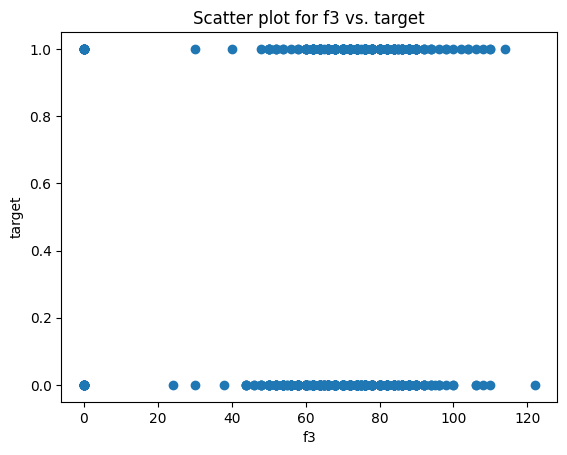

In [6]:
import matplotlib.pyplot as plt

plt.scatter(df['f3'], df['target'])
plt.xlabel('f3')
plt.ylabel('target')
plt.title('Scatter plot for f3 vs. target')
plt.show()

### STEP - 2: PREPROCESS THE DATASET

In [7]:
# We observe from this statistics that we did not receive stats from other variables, so we have to check the type of these variables

df['f2'].head()

0    148
1     85
2    183
3     89
4    137
Name: f2, dtype: object

In [8]:
pd.unique(df['f1'])

array(['6', '1', '8', '0', '5', '3', '10', '2', '4', '7', '9', '11', '13',
       '15', '17', '12', '14', 'c'], dtype=object)

In [9]:
pd.unique(df['f2'])

array(['148', '85', '183', '89', '137', '116', '78', '115', '197', '125',
       '110', '168', '139', '189', '166', '100', '118', '107', '103',
       '126', '99', '196', '119', '143', '147', '97', '145', '117', '109',
       '158', '88', '92', '122', '138', '102', '90', '111', '180', '133',
       '106', '171', '159', '146', '71', '105', '101', '176', '150', '73',
       '187', '84', '44', '141', '114', '95', '129', '79', '0', '62',
       '131', '112', '113', '74', '83', '136', '80', '123', '81', '134',
       '142', '144', '93', '163', '151', '96', '155', '76', '160', '124',
       '162', '132', '120', '173', '170', '128', '108', '154', '57',
       '156', '153', '188', '152', '104', '87', '75', '179', '130', '194',
       '181', '135', '184', '140', '177', '164', '91', '165', '86', '193',
       '191', '161', '167', '77', '182', '157', '178', '61', '98', '127',
       '82', '72', '172', '94', '175', '195', '68', '186', '198', '121',
       '67', '174', '199', '56', '169', '149', '6

In [10]:
pd.unique(df['f4'])

array(['35', '29', '0', '23', '32', '45', '19', '47', '38', '30', '41',
       '33', '26', '15', '36', '11', '31', '37', '42', '25', '18', '24',
       '39', '27', '21', '34', '10', '60', '13', '20', '22', '28', '54',
       '40', '51', '56', '14', '17', '50', '44', '12', '46', '16', '7',
       '52', '43', '48', '8', '49', '63', '99', 'a'], dtype=object)

In [11]:
pd.unique(df['f5'])

array(['0', '94', '168', '88', '543', '846', '175', '230', '83', '96',
       '235', '146', '115', '140', '110', '245', '54', '192', '207', '70',
       '240', '82', '36', '23', '300', '342', '304', '142', '128', '38',
       '100', '90', '270', '71', '125', '176', '48', '64', '228', '76',
       '220', '40', '152', '18', '135', '495', '37', '51', '99', '145',
       '225', '49', '50', '92', '325', '63', '284', '119', '204', '155',
       '485', '53', '114', '105', '285', '156', '78', '130', '55', '58',
       '160', '210', '318', '44', '190', '280', '87', '271', '129', '120',
       '478', '56', '32', '744', '370', '45', '194', '680', '402', '258',
       '375', '150', '67', '57', '116', '278', '122', '545', '75', '74',
       '182', '360', '215', '184', '42', '132', '148', '180', '205', '85',
       '231', '29', '68', '52', '255', '171', '73', '108', '43', '167',
       '249', '293', '66', '465', '89', '158', '84', '72', '59', '81',
       '196', '415', '275', '165', '579', '310', '6

In [12]:
pd.unique(df['f6'])

array(['33.6', '26.6', '23.3', '28.1', '43.1', '25.6', '31', '35.3',
       '30.5', '0', '37.6', '38', '27.1', '30.1', '25.8', '30', '45.8',
       '29.6', '43.3', '34.6', '39.3', '35.4', '39.8', '29', '36.6',
       '31.1', '39.4', '23.2', '22.2', '34.1', '36', '31.6', '24.8',
       '19.9', '27.6', '24', '33.2', '32.9', '38.2', '37.1', '34', '40.2',
       '22.7', '45.4', '27.4', '42', '29.7', '28', '39.1', '19.4', '24.2',
       '24.4', '33.7', '34.7', '23', '37.7', '46.8', '40.5', '41.5', '25',
       '25.4', '32.8', '32.5', '42.7', '19.6', '28.9', '28.6', '43.4',
       '35.1', '32', '24.7', '32.6', '43.2', '22.4', '29.3', '24.6',
       '48.8', '32.4', '38.5', '26.5', '19.1', '46.7', '23.8', '33.9',
       '20.4', '28.7', '49.7', '39', '26.1', '22.5', '39.6', '29.5',
       '34.3', '37.4', '33.3', '31.2', '28.2', '53.2', '34.2', '26.8',
       '55', '42.9', '34.5', '27.9', '38.3', '21.1', '33.8', '30.8',
       '36.9', '39.5', '27.3', '21.9', '40.6', '47.9', '50', '25.2',
       

In [13]:
pd.unique(df['f7'])

array(['0.627', '0.351', '0.672', '0.167', '2.288', '0.201', '0.248',
       '0.134', '0.158', '0.232', '0.191', '0.537', '1.441', '0.398',
       '0.587', '0.484', '0.551', '0.254', '0.183', '0.529', '0.704',
       '0.388', '0.451', '0.263', '0.205', '0.257', '0.487', '0.245',
       '0.337', '0.546', '0.851', '0.267', '0.188', '0.512', '0.966',
       '0.42', '0.665', '0.503', '1.39', '0.271', '0.696', '0.235',
       '0.721', '0.294', '1.893', '0.564', '0.586', '0.344', '0.305',
       '0.491', '0.526', '0.342', '0.467', '0.718', '0.962', '1.781',
       '0.173', '0.304', '0.27', '0.699', '0.258', '0.203', '0.855',
       '0.845', '0.334', '0.189', '0.867', '0.411', '0.583', '0.231',
       '0.396', '0.14', '0.391', '0.37', '0.307', '0.102', '0.767',
       '0.237', '0.227', '0.698', '0.178', '0.324', '0.153', '0.165',
       '0.443', '0.261', '0.277', '0.761', '0.255', '0.13', '0.323',
       '0.356', '0.325', '1.222', '0.179', '0.262', '0.283', '0.93',
       '0.801', '0.207', '0

We can observe that all of the unique values for the columns are numerical except for one value and that one value is repeated only once, so we can replace it with some random value and convert the columns to numerical values.

In [14]:
pd.unique(df['f1'])

array(['6', '1', '8', '0', '5', '3', '10', '2', '4', '7', '9', '11', '13',
       '15', '17', '12', '14', 'c'], dtype=object)

In [15]:
df = df.drop(df[(df['f1'] == 'c')].index, axis = 0)

In [16]:
df = df.drop(df[(df['f2'] == 'f')].index, axis = 0)
df = df.drop(df[(df['f4'] == 'a')].index, axis = 0)
df = df.drop(df[(df['f5'] == 'b')].index, axis = 0)
df = df.drop(df[(df['f6'] == 'd')].index, axis = 0)
df = df.drop(df[(df['f7'] == 'e')].index, axis = 0)

In [17]:
df.shape

(760, 8)

In [18]:
# Converting categorical to numerical values
df['f1'] = pd.to_numeric(df['f1'])
df['f2'] = pd.to_numeric(df['f2'])
df['f4'] = pd.to_numeric(df['f4'])
df['f5'] = pd.to_numeric(df['f5'])
df['f6'] = pd.to_numeric(df['f6'])
df['f7'] = pd.to_numeric(df['f7'])

In [19]:
# Looking the description of the dataset
df.describe()

,f1,f2,f3,f4,f5,f6,f7,target
count,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000,760.000000
mean,3.834211,120.969737,69.119737,20.507895,80.234211,31.998684,0.473250,0.350000
std,3.364762,32.023301,19.446088,15.958029,115.581444,7.899724,0.332277,0.477284
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.078000,0.000000
25%,1.000000,99.000000,63.500000,0.000000,0.000000,27.300000,0.243750,0.000000
50%,3.000000,117.000000,72.000000,23.000000,36.000000,32.000000,0.375500,0.000000
75%,6.000000,141.000000,80.000000,32.000000,128.250000,36.600000,0.627500,1.000000
max,17.000000,199.000000,122.000000,99.000000,846.000000,67.100000,2.420000,1.000000


All of our columns are now containing numerical values, as we observe the data is not scaled, we have to arrange the values such that the mean is 0 and standard deviation is 1. We can perform this by using StandardScaler method.

In [20]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
new_df = df.drop('target', axis = 'columns')

scaled_data = scaler.fit_transform(new_df)

scaled_df = pd.DataFrame(scaled_data, columns = new_df.columns)

In [21]:
scaled_df.head()

,f1,f2,f3,f4,f5,f6,f7
0,0.644092,0.844637,0.148213,0.908737,-0.694636,0.202839,0.463021
1,-0.842876,-1.123976,-0.160536,0.532503,-0.694636,-0.683852,-0.368158
2,1.238879,1.938311,-0.263452,-1.285961,-0.694636,-1.101863,0.598540
3,-0.842876,-0.998985,-0.160536,0.156269,0.119179,-0.493847,-0.922278
4,-1.140270,0.500911,-1.498446,0.908737,0.759842,1.406204,5.465156


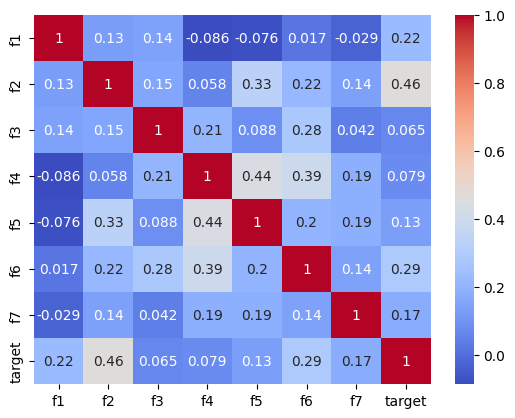

In [22]:
corr_matrix = df.corr()

import seaborn as sns

sns.heatmap(corr_matrix, annot=True, cmap='coolwarm')

plt.show()


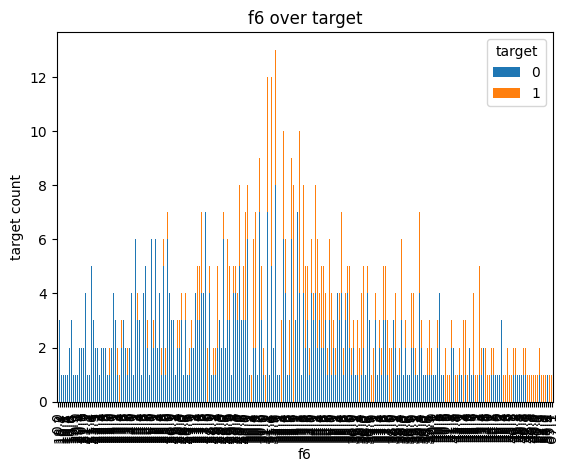

In [23]:
df.groupby(['f6', 'target']).size().unstack().plot(kind='bar', stacked=True)
plt.xlabel('f6')
plt.ylabel('target count')
plt.title('f6 over target')
plt.show()

In [24]:
X = scaled_df
y = df['target']

In [25]:
from sklearn.model_selection import train_test_split

#Split the dataset into training and testing sets
x_train, x_test, y_train, y_test =  train_test_split(X, y, test_size = 0.2, random_state = 42)

In [26]:
print("The shapes of x_train, y_train, x_test, y_test are ", x_train.shape, y_train.shape, x_test.shape, y_test.shape)

The shapes of x_train, y_train, x_test, y_test are  (608, 7) (608,) (152, 7) (152,)


In [27]:
# Further splitting the training set into train and validation sets

x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size = 0.2, random_state = 42)

In [28]:
print("The shapes of x_train, y_train, x_val, y_val are ", x_train.shape, y_train.shape, x_val.shape, y_val.shape)

The shapes of x_train, y_train, x_val, y_val are  (486, 7) (486,) (122, 7) (122,)


### STEP - 3: DEFINING THE NEURAL NETWORK

* How many input neurons are there?
    - The number of input neurons is dependent on the number of predictor features which are equal to 7.
    - So, the input neurons are decided as 7.
* What activation function will you choose?
    - ReLU as the target variable is a continous variable.
* What is the number of hidden layers?
    - We have chosen 3 number of hidden layers for our neural network to not complicate the model.
* What is the size of each hidden layer?
    - We have decided the size of each hiddent layer to be 64,128,64
* What activation function is used for the hidden and output layer?
    - ReLu is chosen for the hidden layers
    - Sigmoid is chosen for the output layers as our target variable is binary classified.

In [29]:
# Using the above neural network model, building the model

import torch.nn as nn

class NeuralNetwork(nn.Module):
    def __init__(self, dropout_rate, activation_fun):
        super(NeuralNetwork, self).__init__()
        self.fc1 = nn.Linear(7, 64)
        self.dropout1 = nn.Dropout(p=dropout_rate)
        self.act1 = activation_fun()
        self.fc2 = nn.Linear(64, 128)
        self.dropout2 = nn.Dropout(p=dropout_rate)
        self.act2= activation_fun()
        self.fc3 = nn.Linear(128, 64)
        self.dropout3 = nn.Dropout(p=dropout_rate)
        self.act3 = activation_fun()
        self.fc4 = nn.Linear(64, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.dropout1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.dropout2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.dropout3(x)
        x = self.act3(x)
        x = self.fc4(x)
        x = self.sigmoid(x)
        return x

In [30]:
model = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)
print(model)

NeuralNetwork(
  (fc1): Linear(in_features=7, out_features=64, bias=True)
  (dropout1): Dropout(p=0.1, inplace=False)
  (act1): ReLU()
  (fc2): Linear(in_features=64, out_features=128, bias=True)
  (dropout2): Dropout(p=0.1, inplace=False)
  (act2): ReLU()
  (fc3): Linear(in_features=128, out_features=64, bias=True)
  (dropout3): Dropout(p=0.1, inplace=False)
  (act3): ReLU()
  (fc4): Linear(in_features=64, out_features=1, bias=True)
  (sigmoid): Sigmoid()
)


### STEP - 4: TRAINING THE NEURAL NETWORK

In [31]:
# Before training the neural network, we have to convert training models to a subset of 'torch.utils.data.Dataset' as Pytorch only accepts this type of subclass

#Libraries required to install
from torch.utils.data import TensorDataset, DataLoader

In [32]:
# Convert the x_train, y_train dataframes to torch tensors

x_tensor_train = torch.tensor(x_train.values, dtype = torch.float32)
y_tensor_train = torch.tensor(y_train.values, dtype = torch.float32)

In [33]:
# Combining the torch tensors to TensorDataset
train_dataset = TensorDataset(x_tensor_train, y_tensor_train)

# Creating a DataLoader dataset
train_dataloader = DataLoader(train_dataset, batch_size = 32, shuffle = True)

In [34]:
# Similarly repeat the process for validation datasets as well

# Convert the x_val, y_val dataframes to torch tensors
x_tensor_val = torch.tensor(x_val.values, dtype = torch.float32)
y_tensor_val = torch.tensor(y_val.values, dtype = torch.float32)

# Combining the torch tensors to TensorDataset
validation_dataset = TensorDataset(x_tensor_val, y_tensor_val)

# Creating a DataLoader dataset 
validation_dataloader = DataLoader(validation_dataset, batch_size = 32, shuffle = True)

In [35]:
# Repeat the process for test datasets as well

# Convert the x_test, y_test dataframes to torch tensors
x_tensor_test = torch.tensor(x_test.values, dtype = torch.float32)
y_tensor_test = torch.tensor(y_test.values, dtype = torch.float32)

batch_size = 32

# Combining the torch tensors to TensorDataset
test_dataset = TensorDataset(x_tensor_test, y_tensor_test)

# Creating a DataLoader dataset
test_dataloader = DataLoader(test_dataset, batch_size = batch_size, shuffle = False)

In [36]:
# As we have created a Dataloader dataset from our x_train and y_train datasets, we can start training our dataset

# Installing required libraries
import torch.optim as optim

# Initializing learning rate
learning_rate = 0.01

# Choosing Binary Cross Entropy as our loss function
criterion = nn.BCELoss()

# Choosing Stochastic Gradient descent method to optimize
optimizer = optim.SGD(model.parameters(), lr = learning_rate)

# Set the number of epochs
num_epochs = 120

In [37]:
# Start the training loop

from tqdm.auto import tqdm

def train_model(learning_rate, num_epochs, optimizer, criterion, model, train_loader, validation_loader):
    
   # Initializing training loss, training accuracy list
    train_loss_vals = []
    train_accuracy_vals = []
    
    # Initializing testing loss, testing accuracy list
    validation_loss_vals = []
    validation_accuracy_vals = []
    
    for epoch in range(num_epochs):

        # Initializing variables for training accuracy
        train_correct = 0
        train_total = 0

        # Initializing variables for validation accuracy
        validation_correct = 0
        validation_total = 0

        # Initializing train accuracy, validation accuracy
        train_accuracy = 0
        validation_accuracy = 0

        # Initializing training loss, validation loss for computations
        train_loss = 0
        validation_loss = 0

        # Set the model to train mode
        model.train()

        # Start training the model
        for pred_vals, true_vals in tqdm(train_loader):

            # Zero the gradients
            optimizer.zero_grad()

            # Reshaping into a 2D array
            true_vals = true_vals.reshape(-1, 1)

            # Compute the forward pass through the neural network
            result = model(pred_vals)

            # Compute the loss
            loss_vals = criterion(result, true_vals)

            # Compute the gradients using backpropagation
            loss_vals.backward()

            # Update the weights of the network using the optimizer
            optimizer.step()

            # Add the batch loss to the total training loss
            train_loss += loss_vals.item()
            
            # Computing the training accuracy
            train_total += true_vals.size(0)
            train_correct += (result.round() == true_vals).sum().item()
        
        train_accuracy = train_correct/train_total

        # Evaluate the validation loss and accuracy for the current epoch
        model.eval()
        
        with torch.no_grad():
            
            for pred_vals, true_vals in validation_loader:
                
                true_vals = true_vals.reshape(-1, 1)
                
                result = model(pred_vals)
                
                validation_loss += criterion(result, true_vals).item()
                
                result = result.round()
                
                # Computing the validation accuracy
                validation_total += true_vals.size(0)
                validation_correct += (result == true_vals).sum().item()
        
        # Calculating validation accuracy
        validation_accuracy = validation_correct / validation_total

        # Calculating training loss and validation loss
        train_loss = train_loss/len(train_loader.dataset)
        validation_loss = validation_loss/len(validation_loader.dataset)

        train_loss_vals.append(train_loss)
        validation_loss_vals.append(validation_loss)
        
        train_accuracy_vals.append(train_accuracy)
        validation_accuracy_vals.append(validation_accuracy)
        
        if epoch %5 == 0:
            print('Training loss, Training accuracy, and Validation accuracy for epoch {} are {:.3f}, {:.3f} and, {:.3f}'.format(epoch + 1, train_loss, train_accuracy*100, validation_accuracy*100))

    return model, train_loss_vals, validation_loss_vals, train_accuracy_vals, validation_accuracy_vals

In [38]:
# Evaluate the performance of the model on the testing data
def evaluate_test_performance(model, test_dataloader):
    
    model.eval()
    test_loss = 0
    actual_val = 0

    true_labels = []
    pred_labels = []

    with torch.no_grad():
        for pred_vals, true_vals in test_dataloader:
            
            true_vals = true_vals.reshape(-1, 1)
            
            result = model(pred_vals)
            
            test_loss = test_loss + criterion(result, true_vals).item() * len(pred_vals)
            
            result = result.round()
            
            actual_val = actual_val + result.eq(true_vals).sum().item()
            
            true_labels.extend(true_vals.numpy().flatten())
            
            pred_labels.extend(result.numpy().flatten())

    test_loss = test_loss/(len(test_dataloader.dataset))
    accuracy = 100. * actual_val / len(test_dataloader.dataset)
    
    return true_labels, pred_labels, accuracy

In [39]:
model, trainining_loss, validation_loss, training_accuracy, validation_accuracy = train_model(learning_rate, num_epochs, optimizer, criterion, model, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.021, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.021, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.021, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.020, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.020, 66.049 and, 68.033


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.019, 68.107 and, 71.311


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.018, 71.605 and, 72.951


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.018, 74.280 and, 77.049


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.018, 74.280 and, 81.967


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.016, 74.897 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.017, 76.337 and, 82.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.016, 75.720 and, 82.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.016, 75.926 and, 81.967


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.016, 76.543 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.015, 78.189 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.015, 77.160 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.015, 76.543 and, 82.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.016, 77.160 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.016, 75.514 and, 83.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.015, 76.543 and, 82.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.015, 76.132 and, 82.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [40]:
true_labels, pred_labels, test_accuracy = evaluate_test_performance(model, test_dataloader)

In [41]:
print("The performance of the model on the testing data is ", test_accuracy)

The performance of the model on the testing data is  75.0


In [43]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(true_labels, pred_labels)

In [44]:
cm

array([[81, 19],
       [19, 33]])

In [45]:
import matplotlib.pyplot as plt
from sklearn import metrics

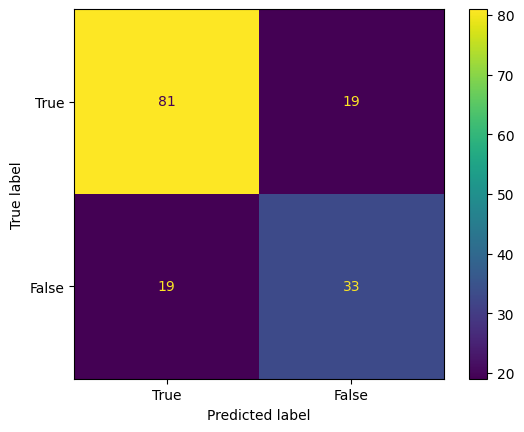

In [46]:
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [True, False])
cm_display.plot()
plt.show()

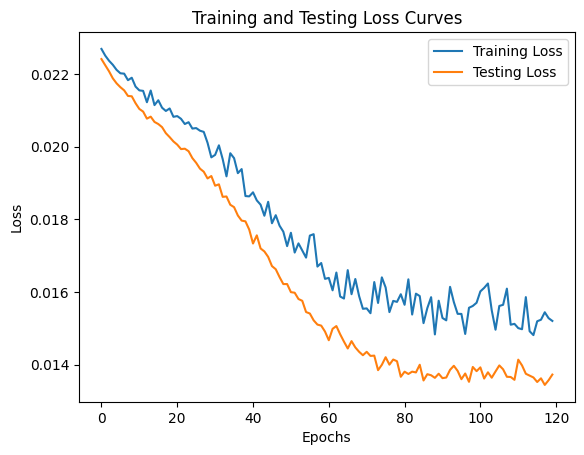

In [47]:
# Plotting the graph to understand the variation between training loss and validation loss

plt.plot(trainining_loss, label = "Training Loss")
plt.plot(validation_loss, label = "Testing Loss")

plt.xlabel("Epochs")
plt.ylabel("Loss")

plt.title("Training and Testing Loss Curves")

plt.legend()

plt.show()

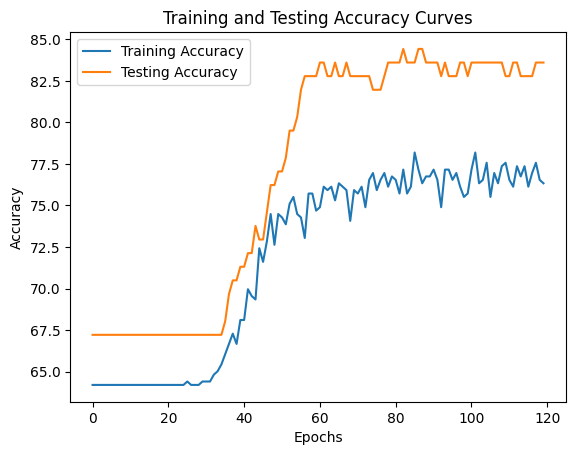

In [48]:

training_accuracy = [acc*100 for acc in training_accuracy]
validation_accuracy = [acc*100 for acc in validation_accuracy]

plt.plot(training_accuracy, label = "Training Accuracy")
plt.plot(validation_accuracy, label = "Testing Accuracy")

plt.xlabel("Epochs")
plt.ylabel("Accuracy")

plt.title("Training and Testing Accuracy Curves")

plt.legend()

plt.show()

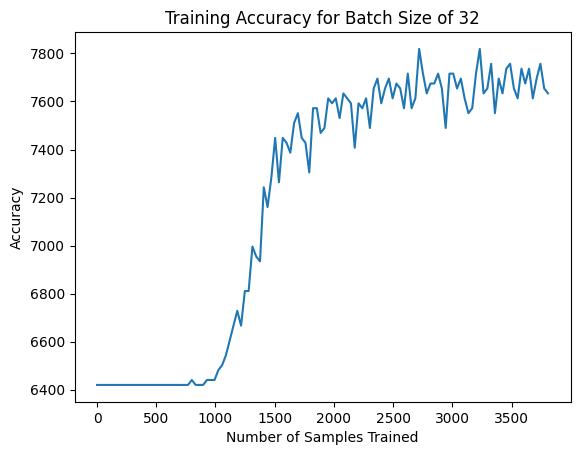

In [49]:
# Graph plotted for validation accuracy

# Define batch size
batch_size = 32

training_accuracy = [acc*100 for acc in training_accuracy]

# Define x-axis values (number of batches)
num_batches = len(training_accuracy)
x_values = [i*batch_size for i in range(num_batches)]

# Plot the accuracy graph
plt.plot(x_values,training_accuracy )

# Add labels to the graph
plt.title("Training Accuracy for Batch Size of 32")
plt.xlabel("Number of Samples Trained")
plt.ylabel("Accuracy")

# Display the graph
plt.show()


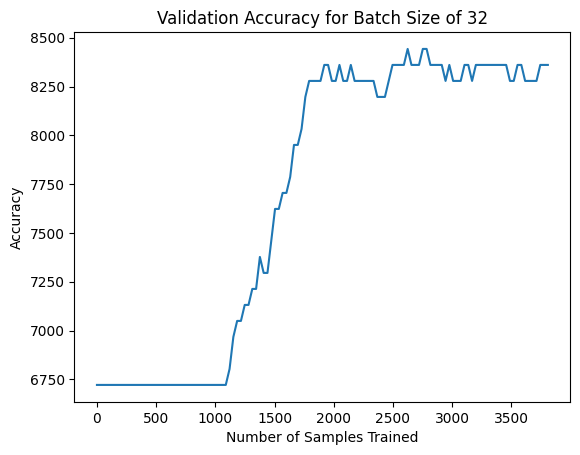

In [50]:
# Graph plotted for Validation accuracy

# Define batch size
batch_size = 32

validation_accuracy = [acc*100 for acc in validation_accuracy]

# Define x-axis values (number of batches)
num_batches = len(validation_accuracy)
x_values = [i*batch_size for i in range(num_batches)]

# Plot the accuracy graph
plt.plot(x_values, validation_accuracy )

# Add labels to the graph
plt.title("Validation Accuracy for Batch Size of 32")
plt.xlabel("Number of Samples Trained")
plt.ylabel("Accuracy")

# Display the graph
plt.show()


## PART - 2: OPTIMIZING NN

#### STEP - 1: CHOOSING 'DROPOUT' HYPERPARAMETER TO TUNE THE MODEL

In [51]:
model_2 = NeuralNetwork(dropout_rate = 0.4, activation_fun = nn.ReLU)

In [52]:
model_2, trainining_loss2, validation_loss2, training_accuracy2, validation_accuracy2 = train_model(learning_rate, num_epochs, optimizer, criterion, model_2, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 40.947 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 40.535 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 38.477 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 36.626 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 39.712 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 39.918 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 39.712 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 38.683 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 41.975 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 42.181 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 39.300 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 44.033 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 41.975 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 41.564 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 40.123 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 40.947 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 42.387 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 40.947 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 43.004 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 43.004 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 40.535 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 41.564 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 40.535 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 38.683 and, 33.607


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [53]:
true_labels, pred_labels, accuracy2 = evaluate_test_performance(model_2, test_dataloader)

In [54]:
print("The accuracy with dropout value equal to 0.4 is ",accuracy2)

The accuracy with dropout value equal to 0.4 is  33.55263157894737


In [55]:
model_3 = NeuralNetwork(dropout_rate = 0.3, activation_fun = nn.ReLU)

In [56]:
model_3, trainining_loss3, validation_loss3, training_accuracy3, validation_accuracy3 = train_model(learning_rate, num_epochs, optimizer, criterion, model_3, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 39.918 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 42.387 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 40.329 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 40.329 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 41.152 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 40.741 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 40.947 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 41.358 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 40.535 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 40.947 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 39.300 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 42.387 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 40.123 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 37.860 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 37.860 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 38.683 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 39.712 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 40.123 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 40.123 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 38.272 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 42.798 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 39.918 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 39.300 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 40.329 and, 36.066


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [57]:
true_labels, pred_labels, accuracy3 = evaluate_test_performance(model_3, test_dataloader)

In [58]:
print("The accuracy with dropout value equal to 0.3 is ",accuracy3)

The accuracy with dropout value equal to 0.3 is  36.8421052631579


In [59]:
model_4 = NeuralNetwork(dropout_rate = 0.2, activation_fun = nn.ReLU)

In [60]:
model_4, trainining_loss4, validation_loss4, training_accuracy4, validation_accuracy4 = train_model(learning_rate, num_epochs, optimizer, criterion, model_4, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 63.786 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 63.786 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 63.786 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 63.374 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 63.580 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 63.786 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [61]:
true_labels, pred_labels, accuracy4 = evaluate_test_performance(model_4, test_dataloader)

In [62]:
print("The accuracy with dropout value equal to 0.2 is ",accuracy4)

The accuracy with dropout value equal to 0.2 is  65.78947368421052


#### STEP - 2: CHANGING 'OPTIMIZER', 'ACTIVATION FUNCTION'  HYPERPARAMETER TO TUNE THE MODEL

The model which gave us the best accuracy is the model with dropout_rate = 0.1, so this will be our base model.

In [63]:
model_adagrad = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

In [64]:
optimizer_adagrad = optim.Adagrad(model_adagrad.parameters(), lr=0.01)

In [65]:
model_adagrad, trainining_loss5, validation_loss5, training_accuracy5, validation_accuracy5 = train_model(learning_rate, num_epochs, optimizer, criterion, model_adagrad, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 47.119 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 45.473 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 46.091 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 45.885 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 47.325 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 51.440 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 49.177 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 44.650 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 44.650 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 46.502 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 46.914 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 46.296 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 49.177 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 44.856 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 46.708 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 49.177 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 46.296 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 46.708 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 46.091 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 46.091 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 46.091 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 44.033 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 49.177 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 43.004 and, 40.164


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [66]:
true_labels, pred_labels, accuracy_adagrad = evaluate_test_performance(model_adagrad, test_dataloader)

In [67]:
print("The accuracy using adagrad optimizer is ",accuracy_adagrad)

The accuracy using adagrad optimizer is  38.81578947368421


In [68]:
model_rmsprop = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

In [69]:
optimizer_rmsprop = optim.RMSprop(model_rmsprop.parameters(), lr = learning_rate)

In [70]:
model_rmsprop, trainining_loss6, validation_loss6, training_accuracy6, validation_accuracy6 = train_model(learning_rate, num_epochs, optimizer, criterion, model_rmsprop, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 36.008 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 36.008 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 36.008 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [71]:
true_labels, pred_labels, accuracy_rmsprop = evaluate_test_performance(model_rmsprop, test_dataloader)

In [72]:
print("The accuracy using rms prop optimizer is ",accuracy_rmsprop)

The accuracy using rms prop optimizer is  34.21052631578947


In [73]:
model_adam = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

In [74]:
optimizer_adam = optim.Adam(model.parameters(), lr=0.01)

In [75]:
model_adam, trainining_loss7, validation_loss7, training_accuracy7, validation_accuracy7 = train_model(learning_rate, num_epochs, optimizer, criterion, model_adam, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 34.156 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 35.185 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 34.362 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 34.156 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 34.774 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 34.568 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 34.774 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 35.185 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 34.774 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 34.979 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 34.774 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 35.391 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 35.391 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 34.568 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 34.156 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 35.185 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 34.568 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 34.979 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 34.774 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 34.156 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 34.568 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 33.745 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [76]:
true_labels, pred_labels, accuracy_adam = evaluate_test_performance(model_adam, test_dataloader)

In [77]:
print("The accuracy using adam optimizer is ",accuracy_adam)

The accuracy using adam optimizer is  34.21052631578947


ACTIVATION FUNCTIONS

In [78]:
# Activation Function

# Tanh activation function
model_tanh = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.Tanh)

In [79]:
model_tanh, trainining_loss8, validation_loss8, training_accuracy8, validation_accuracy8 = train_model(learning_rate, num_epochs, optimizer, criterion, model_tanh, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.024, 33.951 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.024, 32.510 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.024, 32.510 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.024, 33.745 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.024, 32.922 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.024, 33.745 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.024, 34.774 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.024, 34.362 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.024, 34.568 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.024, 31.687 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.024, 36.008 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.024, 32.099 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.024, 32.922 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.024, 32.510 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.024, 32.716 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.024, 32.716 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.024, 35.597 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.024, 31.893 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.024, 34.979 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.024, 34.156 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.024, 31.893 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.024, 32.305 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.024, 33.745 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.024, 34.774 and, 31.148


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [80]:
true_labels, pred_labels, accuracy_tanh = evaluate_test_performance(model_tanh, test_dataloader)

In [81]:
print("The accuracy using Tanh activation function is ",accuracy_tanh)

The accuracy using Tanh activation function is  32.23684210526316


In [82]:
class NeuralNetwork_Leaky(nn.Module):
    def __init__(self, dropout_rate):
        super(NeuralNetwork_Leaky, self).__init__()
        self.fc1 = nn.Linear(7, 64)
        self.dropout1 = nn.Dropout(p=dropout_rate)
        self.act1 = nn.LeakyReLU(0.2)
        self.fc2 = nn.Linear(64, 128)
        self.dropout2 = nn.Dropout(p=dropout_rate)
        self.act2= nn.LeakyReLU(0.2)
        self.fc3 = nn.Linear(128, 64)
        self.dropout3 = nn.Dropout(p=dropout_rate)
        self.act3 = nn.LeakyReLU(0.2)
        self.fc4 = nn.Linear(64, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.dropout1(x)
        x = self.act1(x)
        x = self.fc2(x)
        x = self.dropout2(x)
        x = self.act2(x)
        x = self.fc3(x)
        x = self.dropout3(x)
        x = self.act3(x)
        x = self.fc4(x)
        x = self.sigmoid(x)
        return x

In [83]:
# Leaky ReLU activation function
model_leakyrelu = NeuralNetwork_Leaky(dropout_rate = 0.1)

In [84]:
model_leakyrelu, trainining_loss9, validation_loss9, training_accuracy49, validation_accuracy9 = train_model(learning_rate, num_epochs, optimizer, criterion, model_leakyrelu, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 52.469 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 51.440 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 51.029 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 52.675 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 50.000 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 52.675 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 51.029 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 51.029 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 52.263 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 50.617 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 53.292 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 51.029 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 49.177 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 49.794 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 50.412 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 50.412 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 50.823 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 52.469 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 51.440 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 52.263 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 52.263 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 46.914 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 48.765 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 51.029 and, 55.738


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [85]:
true_labels, pred_labels, accuracy_leakyrelu = evaluate_test_performance(model_leakyrelu, test_dataloader)

In [86]:
print("The accuracy using Leaky ReLU activation function is ",accuracy_leakyrelu)

The accuracy using Leaky ReLU activation function is  57.23684210526316


In [87]:
# Sigmoid activation function
model_sigmoid = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.Sigmoid)

In [88]:
model_sigmoid, trainining_loss10, validation_loss10, training_accuracy10, validation_accuracy10 = train_model(learning_rate, num_epochs, optimizer, criterion, model_sigmoid, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.026, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.025, 35.802 and, 32.787


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [89]:
true_labels, pred_labels, accuracy_sigmoid = evaluate_test_performance(model_sigmoid, test_dataloader)

In [90]:
print("The accuracy using Sigmoid activation function is ",accuracy_sigmoid)

The accuracy using Sigmoid activation function is  34.21052631578947


Our base model gave us the best accuracy after changing the optimiziers and activation functions.

#### STEP - 3 : CHOOSING DIFFERENT MODELS TO IMPROVE ACCURACY

After changing and running models with different hyperparameters, we observed that our model was showing very less accuracy when increasing dropout value, and the best accuracy was observed when the optimizer was equal to Stochastic gradient descent and activation function equal to 'ReLU'. So, we choose our initial model as our 'base model'.

#### EARLY STOPPING

In [91]:
model_earlystopping = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

In [92]:
# Start the training loop

from tqdm.auto import tqdm

def train_model_earlystopping(learning_rate, num_epochs, optimizer, criterion, model, train_loader, validation_loader):

    best_loss = float('inf')
    patience = 5
    
   # Initializing training loss, training accuracy list
    train_loss_vals = []
    train_accuracy_vals = []
    
    # Initializing testing loss, testing accuracy list
    validation_loss_vals = []
    validation_accuracy_vals = []
    
    for epoch in range(num_epochs):

        # Initializing variables for training accuracy
        train_correct = 0
        train_total = 0

        # Initializing variables for validation accuracy
        validation_correct = 0
        validation_total = 0

        # Initializing train accuracy, validation accuracy
        train_accuracy = 0
        validation_accuracy = 0

        #Initializing training loss, training accuracy for computations
        train_loss = 0
        validation_loss = 0

        # Set the model to train mode
        model.train()

        # Start training the model
        for pred_vals, true_vals in tqdm(train_loader):

            # Zero the gradients
            optimizer.zero_grad()

            # Reshaping into a 2D array
            true_vals = true_vals.reshape(-1, 1)

            # Compute the forward pass through the neural network
            result = model(pred_vals)

            # Compute the loss
            loss_vals = criterion(result, true_vals)

            # Compute the gradients using backpropagation
            loss_vals.backward()

            # Update the weights of the network using the optimizer
            optimizer.step()

            # Add the batch loss to the total training loss
            train_loss += loss_vals.item()
            
            # Computing the training accuracy
            train_total += true_vals.size(0)
            train_correct += (result.round() == true_vals).sum().item()
        
        train_accuracy = train_correct/train_total

        # Evaluate the validation loss and accuracy for the current epoch
        model.eval()
        
        with torch.no_grad():
            
            for pred_vals, true_vals in validation_loader:
                
                true_vals = true_vals.reshape(-1, 1)
                
                result = model(pred_vals)
                
                validation_loss += criterion(result, true_vals).item()
                
                result = result.round()
                
                # Computing the validation accuracy
                validation_total += true_vals.size(0)
                validation_correct += (result == true_vals).sum().item()
        
        # Calculating validation accuracy
        validation_accuracy = validation_correct / validation_total

        # Calculating training loss and validation loss
        train_loss = train_loss/len(train_loader.dataset)
        validation_loss = validation_loss/len(validation_loader.dataset)

        if validation_loss < best_loss:
          best_loss = validation_loss
          patience_counter = 0
        else:
          patience_counter += 1

        if patience_counter >= patience:
          break

        train_loss_vals.append(train_loss)
        validation_loss_vals.append(validation_loss)
        
        train_accuracy_vals.append(train_accuracy)
        validation_accuracy_vals.append(validation_accuracy)
        
        if epoch %5 == 0:
            print('Training loss, Training accuracy, and Validation accuracy for epoch {} are {:.3f}, {:.3f} and, {:.3f}'.format(epoch + 1, train_loss, train_accuracy*100, validation_accuracy*100))

    return model, train_loss_vals, validation_loss_vals, train_accuracy_vals, validation_accuracy_vals

In [93]:
model_earlystopping, trainining_loss11, validation_loss11, training_accuracy11, validation_accuracy11 = train_model_earlystopping(learning_rate, num_epochs, optimizer, criterion, model_earlystopping, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 63.786 and, 66.393


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 66.461 and, 66.393


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [94]:
true_labels, pred_labels, accuracy_earlystopping = evaluate_test_performance(model_earlystopping, test_dataloader)

In [95]:
print("The accuracy obtained after implementing early stopping method is ", accuracy_earlystopping)

The accuracy obtained after implementing early stopping method is  60.526315789473685


#### K-FOLD

In [96]:
from sklearn.model_selection import KFold

# Split the data into train and test sets
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Define the number of folds
k = 5

# Create a KFold object with n_splits=k
kf = KFold(n_splits=k, shuffle=True)

x_train_np = x_train.to_numpy()
y_train_np = y_train.to_numpy()

# Loop over the folds
for fold, (train_indices, val_indices) in enumerate(kf.split(x_train_np)):
    
    # Select the training and validation data
    x_train_fold = x_train_np[train_indices]
    y_train_fold = y_train_np[train_indices]
    x_val_fold = x_train_np[val_indices]
    y_val_fold = y_train_np[val_indices]

    # Convert the numpy arrays to torch tensors
    x_train_tensor = torch.tensor(x_train_fold, dtype=torch.float32)
    y_train_tensor = torch.tensor(y_train_fold, dtype=torch.float32)
    x_val_tensor = torch.tensor(x_val_fold, dtype=torch.float32)
    y_val_tensor = torch.tensor(y_val_fold, dtype=torch.float32)

    # Create the training and validation datasets
    train_dataset = TensorDataset(x_train_tensor, y_train_tensor)
    val_dataset = TensorDataset(x_val_tensor, y_val_tensor)

    # Create the data loaders
    train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
    validation_loader = DataLoader(val_dataset, batch_size=32, shuffle=True)

In [97]:
# Repeat the process for test datasets as well

# Convert the numpy arrays to torch tensors for the test set
x_test_tensor = torch.tensor(x_test.to_numpy(), dtype=torch.float32)
y_test_tensor = torch.tensor(y_test.to_numpy(), dtype=torch.float32)

# Create the test dataset
test_dataset = TensorDataset(x_test_tensor, y_test_tensor)

# Create the test loader
test_loader = DataLoader(test_dataset, batch_size = 32, shuffle=True)

In [98]:
# K-Fold method
model_kfold = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

In [99]:
model_kfold, trainining_loss12, validation_loss12, training_accuracy12, validation_accuracy12 = train_model(learning_rate, num_epochs, optimizer, criterion, model_kfold, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.023, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.023, 62.757 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.023, 61.111 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.023, 62.346 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.023, 63.580 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.023, 62.346 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.023, 61.111 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 61.317 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 61.523 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.023, 63.169 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.023, 61.728 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 61.317 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.023, 62.140 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.023, 61.317 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 61.317 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.023, 62.551 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 61.523 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.023, 61.523 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.023, 62.140 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.023, 62.757 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.023, 60.288 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.023, 62.963 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.023, 61.934 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.023, 62.551 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [100]:
true_labels, pred_labels, accuracy_kfold = evaluate_test_performance(model_kfold, test_loader)

In [101]:
print("The accuracy obtained after implementing k-fold method is ", accuracy_kfold)

The accuracy obtained after implementing k-fold method is  67.76315789473684


#### LEARNING RATE SCHEDULER

In [102]:
import torch.optim.lr_scheduler as lr_scheduler

# Learning rate scheduler model
model_lr = NeuralNetwork(dropout_rate = 0.1, activation_fun = nn.ReLU)

# Define your learning rate scheduler
scheduler = lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.1, patience=5)

In [103]:
# Start the training loop

from tqdm.auto import tqdm

def train_model_lr(learning_rate, num_epochs, optimizer, criterion, model, train_loader, validation_loader):
    
   # Initializing training loss, training accuracy list
    train_loss_vals = []
    train_accuracy_vals = []
    
    # Initializing testing loss, testing accuracy list
    validation_loss_vals = []
    validation_accuracy_vals = []
    
    for epoch in range(num_epochs):

        # Initializing variables for training accuracy
        train_correct = 0
        train_total = 0

        # Initializing variables for validation accuracy
        validation_correct = 0
        validation_total = 0

        # Initializing train accuracy, validation accuracy
        train_accuracy = 0
        validation_accuracy = 0

        #Initializing training loss, training accuracy for computations
        train_loss = 0
        validation_loss = 0

        # Set the model to train mode
        model.train()

        # Start training the model
        for pred_vals, true_vals in tqdm(train_loader):

            # Zero the gradients
            optimizer.zero_grad()

            # Reshaping into a 2D array
            true_vals = true_vals.reshape(-1, 1)

            # Compute the forward pass through the neural network
            result = model(pred_vals)

            # Compute the loss
            loss_vals = criterion(result, true_vals)

            # Compute the gradients using backpropagation
            loss_vals.backward()

            # Update the weights of the network using the optimizer
            optimizer.step()

            # Add the batch loss to the total training loss
            train_loss += loss_vals.item()
            
            # Computing the training accuracy
            train_total += true_vals.size(0)
            train_correct += (result.round() == true_vals).sum().item()
        
        train_accuracy = train_correct/train_total

        # Evaluate the validation loss and accuracy for the current epoch
        model.eval()
        
        with torch.no_grad():
            
            for pred_vals, true_vals in validation_loader:
                
                true_vals = true_vals.reshape(-1, 1)
                
                result = model(pred_vals)
                
                validation_loss += criterion(result, true_vals).item()
                
                result = result.round()
                
                # Computing the validation accuracy
                validation_total += true_vals.size(0)
                validation_correct += (result == true_vals).sum().item()
        
        # Calculating validation accuracy
        validation_accuracy = validation_correct / validation_total

        # Calculating training loss and validation loss
        train_loss = train_loss/len(train_loader.dataset)
        validation_loss = validation_loss/len(validation_loader.dataset)

        scheduler.step(validation_loss)

        train_loss_vals.append(train_loss)
        validation_loss_vals.append(validation_loss)
        
        train_accuracy_vals.append(train_accuracy)
        validation_accuracy_vals.append(validation_accuracy)
        
        if epoch %5 == 0:
            print('Training loss, Training accuracy, and Validation accuracy for epoch {} are {:.3f}, {:.3f} and, {:.3f}'.format(epoch + 1, train_loss, train_accuracy*100, validation_accuracy*100))

    return model, train_loss_vals, validation_loss_vals, train_accuracy_vals, validation_accuracy_vals

In [104]:
model_lr, trainining_loss13, validation_loss13, training_accuracy13, validation_accuracy13 = train_model_lr(learning_rate, num_epochs, optimizer, criterion, model_lr, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.022, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.022, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.022, 63.992 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.022, 64.609 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.022, 64.403 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.022, 64.198 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [105]:
true_labels, pred_labels, accuracy_lr = evaluate_test_performance(model_lr, test_dataloader)

In [106]:
print("The accuracy obtained after implementing learning rate scheduler method is ", accuracy_lr)

The accuracy obtained after implementing learning rate scheduler method is  65.78947368421052


#### BATCH NORMALIZATION

In [107]:
# Modifying the model to include batch normalization layers

class NeuralNetwork_BatchNN(nn.Module):
    def __init__(self, dropout_rate):
        super(NeuralNetwork_BatchNN, self).__init__()
        self.fc1 = nn.Linear(7, 64)
        self.bn1 = nn.BatchNorm1d(64)
        self.act1 = nn.ReLU()
        self.dropout1 = nn.Dropout(p=dropout_rate)
        self.fc2 = nn.Linear(64, 128)
        self.bn2 = nn.BatchNorm1d(128)
        self.act2= nn.ReLU()
        self.dropout2 = nn.Dropout(p=dropout_rate)
        self.fc3 = nn.Linear(128, 64)
        self.bn3 = nn.BatchNorm1d(64)
        self.act3 = nn.ReLU()
        self.dropout3 = nn.Dropout(p=dropout_rate)
        self.fc4 = nn.Linear(64, 1)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        x = self.fc1(x)
        x = self.bn1(x)
        x = self.act1(x)
        x = self.dropout1(x)
        x = self.fc2(x)
        x = self.bn2(x)
        x = self.act2(x)
        x = self.dropout2(x)
        x = self.fc3(x)
        x = self.bn3(x)
        x = self.act3(x)
        x = self.dropout3(x)
        x = self.fc4(x)
        x = self.sigmoid(x)
        return x

In [108]:
# Batch Normalization model
model_bn = NeuralNetwork_BatchNN(dropout_rate = 0.1)

In [109]:
model_bn, trainining_loss14, validation_loss14, training_accuracy14, validation_accuracy14 = train_model(learning_rate, num_epochs, optimizer, criterion, model_bn, train_dataloader, validation_dataloader)

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 1 are 0.022, 62.346 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 6 are 0.022, 64.403 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 11 are 0.022, 61.523 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 16 are 0.022, 61.728 and, 67.213


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 21 are 0.022, 63.786 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 26 are 0.022, 63.169 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 31 are 0.022, 60.905 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 36 are 0.023, 60.288 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 41 are 0.023, 61.523 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 46 are 0.022, 60.082 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 51 are 0.022, 64.403 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 56 are 0.023, 60.494 and, 65.574


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 61 are 0.022, 61.728 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 66 are 0.022, 63.169 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 71 are 0.023, 61.934 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 76 are 0.022, 62.551 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 81 are 0.023, 60.905 and, 66.393


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 86 are 0.022, 64.198 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 91 are 0.022, 63.580 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 96 are 0.022, 62.140 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 101 are 0.022, 63.580 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 106 are 0.022, 64.403 and, 63.934


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 111 are 0.022, 62.140 and, 64.754


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

Training loss, Training accuracy, and Validation accuracy for epoch 116 are 0.022, 63.374 and, 65.574


  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [110]:
true_labels, pred_labels, accuracy_bn = evaluate_test_performance(model_bn, test_dataloader)

In [111]:
print("The accuracy obtained after implementing batch normalization method is ", accuracy_bn)

The accuracy obtained after implementing batch normalization method is  65.13157894736842


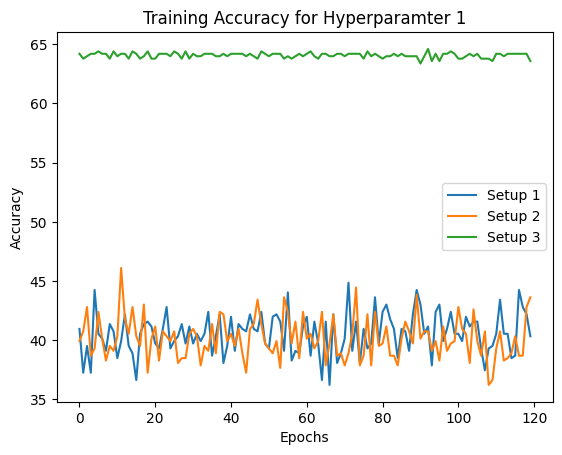

In [113]:
## Training accuracy for 3 setups in part 2 

#Hyperparamter 1
training_accuracy2 = [acc*100 for acc in training_accuracy2]
training_accuracy3 = [acc*100 for acc in training_accuracy3]
training_accuracy4 = [acc*100 for acc in training_accuracy4]


plt.plot(training_accuracy2, label = "Setup 1")
plt.plot(training_accuracy3, label = "Setup 2")
plt.plot(training_accuracy4, label = "Setup 3")

plt.xlabel("Epochs")
plt.ylabel("Accuracy")

plt.title("Training Accuracy for Hyperparamter 1")

plt.legend()

plt.show()

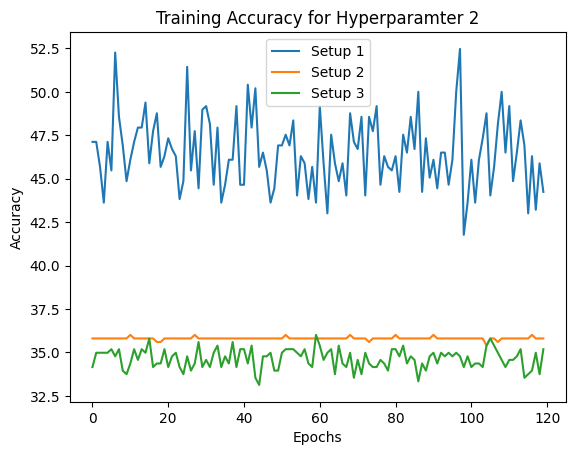

In [114]:
## Training accuracy for 3 setups in part 2 

#Hyperparamter 2
training_accuracy5 = [acc*100 for acc in training_accuracy5]
training_accuracy6 = [acc*100 for acc in training_accuracy6]
training_accuracy7 = [acc*100 for acc in training_accuracy7]


plt.plot(training_accuracy5, label = "Setup 1")
plt.plot(training_accuracy6, label = "Setup 2")
plt.plot(training_accuracy7, label = "Setup 3")

plt.xlabel("Epochs")
plt.ylabel("Accuracy")

plt.title("Training Accuracy for Hyperparamter 2")

plt.legend()

plt.show()

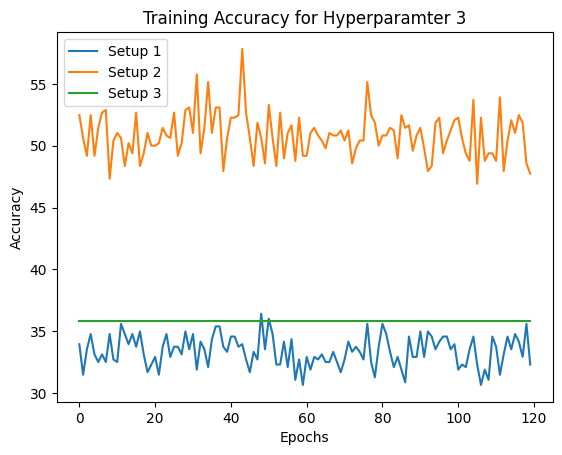

In [115]:
## Training accuracy for 3 setups in part 2 

#Hyperparamter 3
training_accuracy8 = [acc*100 for acc in training_accuracy8]
training_accuracy9 = [acc*100 for acc in training_accuracy49]
training_accuracy10 = [acc*100 for acc in training_accuracy10]


plt.plot(training_accuracy8, label = "Setup 1")
plt.plot(training_accuracy9, label = "Setup 2")
plt.plot(training_accuracy10, label = "Setup 3")

plt.xlabel("Epochs")
plt.ylabel("Accuracy")

plt.title("Training Accuracy for Hyperparamter 3")

plt.legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


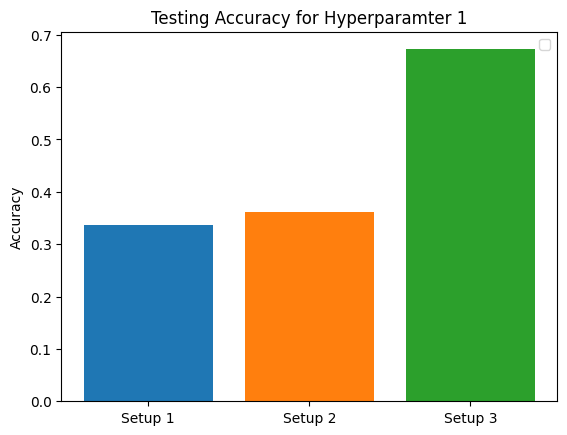

In [116]:
## Testing accuracy for 3 setups in part 2 

#Hyperparamter 1
y1 = validation_accuracy2
x1 = ['Setup 1']
plt.bar(x1, y1)


y2 = validation_accuracy3
x2 = ['Setup 2']
plt.bar(x2, y2)

y3 = validation_accuracy4
x3 = ['Setup 3']
plt.bar(x3, y3)

plt.ylabel("Accuracy")

plt.title("Testing Accuracy for Hyperparamter 1")

plt.legend()

plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


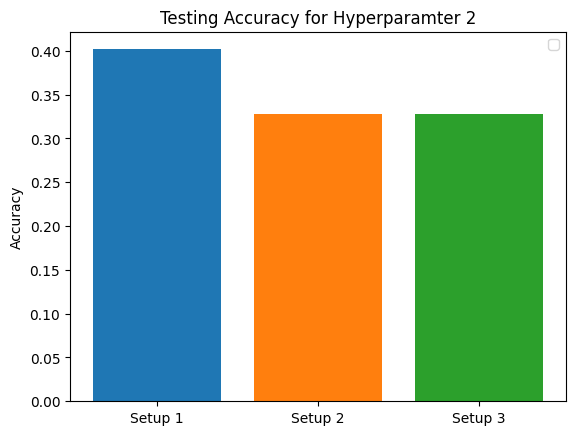

In [117]:
## Training accuracy for 3 setups in part 2 

#Hyperparamter 2
y1 = validation_accuracy5
x1 = ['Setup 1']
plt.bar(x1, y1)


y2 = validation_accuracy6
x2 = ['Setup 2']
plt.bar(x2, y2)

y3 = validation_accuracy7
x3 = ['Setup 3']
plt.bar(x3, y3)

plt.ylabel("Accuracy")

plt.title("Testing Accuracy for Hyperparamter 2")

plt.legend()

plt.show()

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


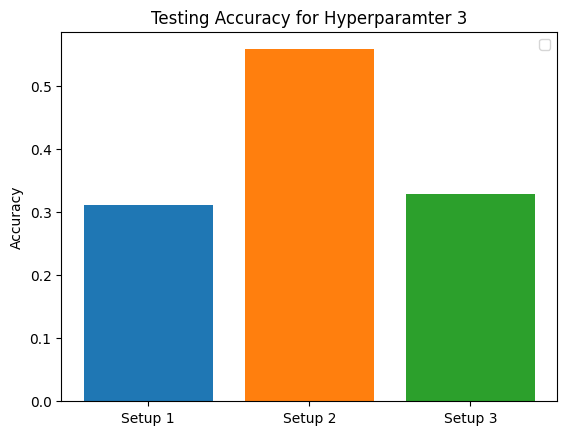

In [118]:
## Training accuracy for 3 setups in part 2 

#Hyperparamter 3
y1 = validation_accuracy8
x1 = ['Setup 1']
plt.bar(x1, y1)


y2 = validation_accuracy9
x2 = ['Setup 2']
plt.bar(x2, y2)

y3 = validation_accuracy10
x3 = ['Setup 3']
plt.bar(x3, y3)

plt.ylabel("Accuracy")

plt.title("Testing Accuracy for Hyperparamter 3")

plt.legend()

plt.show()

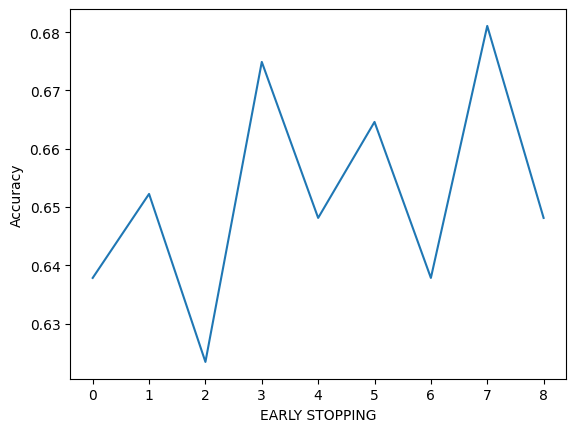

In [120]:
## Training accuracy for early stopping 

y = range(100) 
plt.plot(training_accuracy11)
plt.xlabel('EARLY STOPPING')
plt.ylabel('Accuracy')

plt.show()

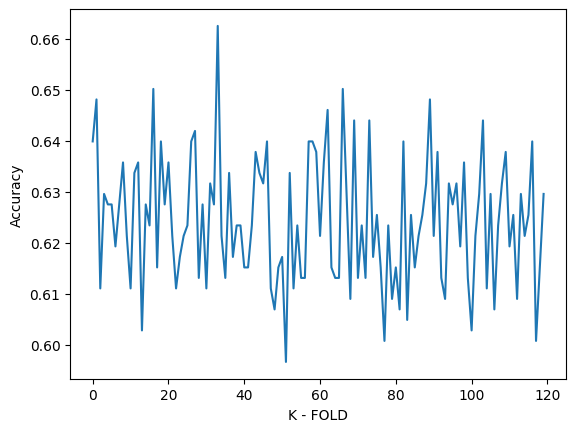

In [121]:
## Training accuracy for k-fold


plt.plot(training_accuracy12)
plt.xlabel('K - FOLD')
plt.ylabel('Accuracy')

plt.show()

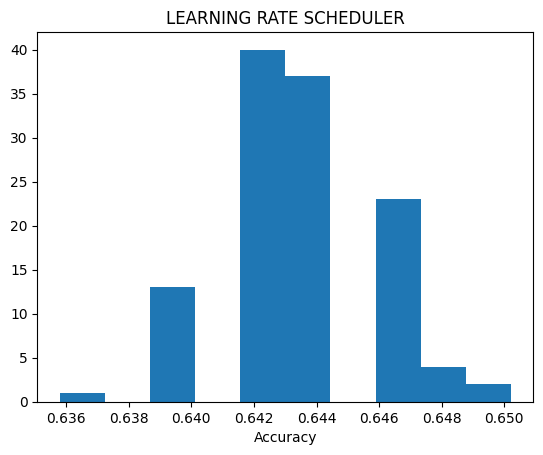

In [129]:
## Training accuracy for learning rate scheduler


plt.hist(training_accuracy13)
plt.xlabel('Accuracy')
plt.title('LEARNING RATE SCHEDULER')

plt.show()

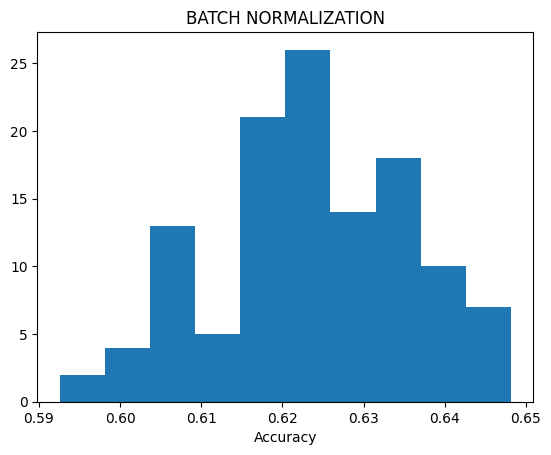

In [130]:
## Training accuracy for batch normalization


plt.hist(training_accuracy14)
plt.title('BATCH NORMALIZATION')
plt.xlabel('Accuracy')

plt.show()